In [ ]:
!pip install spacy

In [ ]:
!pip install datasets


In [ ]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [ ]:
# Downloading a hugginface dataset

!pip install gitpython

In [ ]:

!git lfs install

Git LFS initialized.


In [ ]:
!git clone https://huggingface.co/datasets/allenai/multinews_dense_oracle

fatal: destination path 'multinews_dense_oracle' already exists and is not an empty directory.


In [ ]:
# Importing relevant libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

import re # re stands for regular expression , and it helps in pattern matching in strings , often helpful in text processing , validation  and data cleansing

from bs4 import BeautifulSoup

from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences # used for padding sequence to make to ensure sequences with uniform length
from nltk.corpus import stopwords

from tensorflow.keras.layers import Input,LSTM,Embedding,Dense,Concatenate , TimeDistributed, Bidirectional
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping

import warnings
warnings.filterwarnings("ignore")



In [ ]:
# Importing the dataset

from datasets import load_dataset

builder_dataset = load_dataset("allenai/multinews_dense_oracle")

In [ ]:
# checking out the dataset
builder_dataset

DatasetDict({
    train: Dataset({
        features: ['document', 'summary'],
        num_rows: 44972
    })
    validation: Dataset({
        features: ['document', 'summary'],
        num_rows: 5622
    })
    test: Dataset({
        features: ['document', 'summary'],
        num_rows: 5622
    })
})



```
Start of Text Preprocessing

```



In [ ]:
dataset = load_dataset("./multinews_dense_oracle")
dataset

DatasetDict({
    train: Dataset({
        features: ['document', 'summary'],
        num_rows: 44972
    })
    validation: Dataset({
        features: ['document', 'summary'],
        num_rows: 5622
    })
    test: Dataset({
        features: ['document', 'summary'],
        num_rows: 5622
    })
})

In [ ]:
dataset['train'][0] # checking out the training data

{'document': 'The number of Americans seeking unemployment aid plummeted last week to seasonally adjusted 339,000, the lowest level in more than four years. The sharp drop offered a hopeful sign that the job market could pick up. \n \n In this Friday Sept. 28, 2012, photo, a group of veterans listen during a session with one of the employers at a job fair introducing veterans to careers in the security and private investigations industry... (Associated Press) \n \n The Labor Department said Thursday that weekly applications fell by 30,000 to the fewest since February 2008. The four-week average, a less volatile measure, dropped by 11,500 to 364,000, a six-month low. \n \n The positive figures follow a report last week that said the unemployment rate fell in September to 7.8 percent. It was the first time since January 2009 that the rate dropped below 8 percent. \n \n A Labor Department spokesman cautioned that the weekly applications can be volatile, particularly at the start of a quar

In [ ]:
# Converting train data into a dataframe for easy manipulation
train_df = pd.DataFrame(dataset['train'])
val_df = pd.DataFrame(dataset['validation'])
train_df.shape


(44972, 2)

In [ ]:
# @title
# getting to know the columns
train_df.columns

Index(['document', 'summary'], dtype='object')

In [ ]:

# Basically , we are seperating the input (the long text) and output (the summarised text)
X_train = train_df.drop(['summary'],axis=1)
y_train = train_df['summary']

X_val = val_df.drop(['summary'],axis=1)
y_val = val_df['summary']

## Removing Duplicate and NULL values


In [ ]:
# Checking for NULL values in training data
train_df.isnull().sum()

document    0
summary     0
dtype: int64

In [ ]:
# Checking for NULL values in validation data
val_df.isnull().sum()

document    0
summary     0
dtype: int64

In [ ]:
# Checking for duplicate values

duplicate_train = train_df.duplicated().any()
duplicate_train

False

## Now we will do some Text Preprocessing

### It is necessary because we have limited computational resources , and we dont want to waste these resources on processing that is not useful.

### In addition to this , the model can only understand and manipulate numbers . So , we have to understand what our model expects as an input , and how to modify our data to make it model compatible


In [ ]:
# do contraction mapping ( basically , this will help in reducing the redundancy)

contraction_mapping = {"ain't": "is not", "aren't": "are not","can't": "cannot", "'cause": "because", "could've": "could have", "couldn't": "could not",

                           "didn't": "did not", "doesn't": "does not", "don't": "do not", "hadn't": "had not", "hasn't": "has not", "haven't": "have not",

                           "he'd": "he would","he'll": "he will", "he's": "he is", "how'd": "how did", "how'd'y": "how do you", "how'll": "how will", "how's": "how is",

                           "I'd": "I would", "I'd've": "I would have", "I'll": "I will", "I'll've": "I will have","I'm": "I am", "I've": "I have", "i'd": "i would",

                           "i'd've": "i would have", "i'll": "i will",  "i'll've": "i will have","i'm": "i am", "i've": "i have", "isn't": "is not", "it'd": "it would",

                           "it'd've": "it would have", "it'll": "it will", "it'll've": "it will have","it's": "it is", "let's": "let us", "ma'am": "madam",

                           "mayn't": "may not", "might've": "might have","mightn't": "might not","mightn't've": "might not have", "must've": "must have",

                           "mustn't": "must not", "mustn't've": "must not have", "needn't": "need not", "needn't've": "need not have","o'clock": "of the clock",

                           "oughtn't": "ought not", "oughtn't've": "ought not have", "shan't": "shall not", "sha'n't": "shall not", "shan't've": "shall not have",

                           "she'd": "she would", "she'd've": "she would have", "she'll": "she will", "she'll've": "she will have", "she's": "she is",

                           "should've": "should have", "shouldn't": "should not", "shouldn't've": "should not have", "so've": "so have","so's": "so as",

                           "this's": "this is","that'd": "that would", "that'd've": "that would have", "that's": "that is", "there'd": "there would",

                           "there'd've": "there would have", "there's": "there is", "here's": "here is","they'd": "they would", "they'd've": "they would have",

                           "they'll": "they will", "they'll've": "they will have", "they're": "they are", "they've": "they have", "to've": "to have",

                           "wasn't": "was not", "we'd": "we would", "we'd've": "we would have", "we'll": "we will", "we'll've": "we will have", "we're": "we are",

                           "we've": "we have", "weren't": "were not", "what'll": "what will", "what'll've": "what will have", "what're": "what are",

                           "what's": "what is", "what've": "what have", "when's": "when is", "when've": "when have", "where'd": "where did", "where's": "where is",

                           "where've": "where have", "who'll": "who will", "who'll've": "who will have", "who's": "who is", "who've": "who have",

                           "why's": "why is", "why've": "why have", "will've": "will have", "won't": "will not", "won't've": "will not have",

                           "would've": "would have", "wouldn't": "would not", "wouldn't've": "would not have", "y'all": "you all",

                           "y'all'd": "you all would","y'all'd've": "you all would have","y'all're": "you all are","y'all've": "you all have",

                           "you'd": "you would", "you'd've": "you would have", "you'll": "you will", "you'll've": "you will have",

                           "you're": "you are", "you've": "you have"}


# Since we will use this model later for movie reviews , we will add a contraction mapping for slanf words also

In [ ]:
y_val.dtypes


dtype('O')

### In text preprocessing , we will do the following tasks :

1. Convert everything to lowercase
2. Contraction mapping
3. Remove (‘s)
4. Remove any text inside the parenthesis ( )
5. Eliminate punctuations and special characters
6. Remove stopwords
7. Remove short words

In [ ]:
stop_words = set(stopwords.words('english'))

def text_cleaner(text):
  newString = text.lower()
  newString = BeautifulSoup(newString, "lxml").text
  newString = re.sub(r'\([^)]*\)', '', newString)
  newString = re.sub('"','', newString)
  newString = ' '.join([contraction_mapping[t] if t in contraction_mapping else t for t in newString.split(" ")]) #It iterates over each word t in the list created by splitting newString. For each word t, it checks if t exists as a key in the dictionary contraction_mapping. If it does, it replaces t with the corresponding value from contraction_mapping. If t is not found in contraction_mapping, it leaves t unchanged.
  newString = re.sub(r"'s\b","",newString) # /b is boundary assertion , meaning that it will only check for 's if it is at the end of string
  newString = re.sub("[^a-zA-Z]", " ", newString) # replace any character other than alphabets with empty string
  tokens = [w for w in newString.split() if not w in stop_words]

  longWords=[]


  for i in tokens:
    if(len(i)>=3): # ignore the short words , since they usually don't impart much meaning
      longWords.append(i)

  # if((" ".join(longWords)).strip() == ""):
  #   print(text)
  return (" ".join(longWords)).strip() # will remove trailing and leading white spaces

#print(X_train)
cleanedText=[]
#c = 0
for index, row in X_train.iterrows():
  cleanedText.append(text_cleaner(row['document']))
  # if (cleanedText[-1] == ""):
  #   print(index, row)
  #c += 1

#print(c)
#print(cleanedText[0:5])

train_df.insert(loc=2, column='cleaned_text', value=cleanedText)







In [ ]:
stop_words = set(stopwords.words('english'))

def text_cleaner(text):
  newString = text.lower()
  newString = BeautifulSoup(newString, "lxml").text
  newString = re.sub(r'\([^)]*\)', '', newString)
  newString = re.sub('"','', newString)
  newString = ' '.join([contraction_mapping[t] if t in contraction_mapping else t for t in newString.split(" ")]) #It iterates over each word t in the list created by splitting newString. For each word t, it checks if t exists as a key in the dictionary contraction_mapping. If it does, it replaces t with the corresponding value from contraction_mapping. If t is not found in contraction_mapping, it leaves t unchanged.
  newString = re.sub(r"'s\b","",newString) # /b is boundary assertion , meaning that it will only check for 's if it is at the end of string
  newString = re.sub("[^a-zA-Z]", " ", newString) # replace any character other than alphabets with empty string
  tokens = [w for w in newString.split() if not w in stop_words]

  longWords=[]


  for i in tokens:
    if(len(i)>=3): # ignore the short words , since they usually don't impart much meaning
      longWords.append(i)

  # if((" ".join(longWords)).strip() == ""):
  #   print(text)
  return (" ".join(longWords)).strip() # will remove trailing and leading white spaces

#print(X_train)
cleanedText=[]
#c = 0
for index, row in X_val.iterrows():
  cleanedText.append(text_cleaner(row['document']))
  # if (cleanedText[-1] == ""):
  #   print(index, row)
  #c += 1

#print(c)
#print(cleanedText[0:5])

val_df.insert(loc=2, column='cleaned_text', value=cleanedText)




In [ ]:
print(len(cleanedText) == train_df.size)
print(len(cleanedText))
print(train_df.shape)
print(X_train.size)
print(cleanedText.count(0))
print(cleanedText.count('0'))
"" in cleanedText
"" in train_df['cleaned_text']
# train_df.iloc[42993]['document']

False
5622
(44972, 3)
44972
0
0


False

In [ ]:
train_df.describe()

,document,summary,cleaned_text
count,44972,44972,44972
unique,44758,44972,44758
top,,– The unemployment rate dropped to 8.2% last m...,
freq,8,1,8


In [ ]:
def summary_cleaner(text):
    newString = re.sub('"','', text) # remove ""
    newString = ' '.join([contraction_mapping[t] if t in contraction_mapping else t for t in newString.split(" ")]) # Expand the word if it's full form is in contraction mappingh
    newString = re.sub(r"'s\b","",newString)
    newString = re.sub("[^a-zA-Z]", " ", newString)
    newString = newString.lower()
    tokens=newString.split()
    newString=''
    for i in tokens:
        if len(i)>1:
            newString=newString+i+' '
    return newString

#Call the above function
cleaned_summary = []
for t in y_train:
    cleaned_summary.append(summary_cleaner(t))


# cleanedText=[]
# for t in X_train:
#   cleanedText.append(text_cleaner(t))


train_df.insert(loc=3, column='cleaned_summary', value=cleaned_summary)
train_df['cleaned_summary'].replace('', np.nan, inplace=True)
train_df.dropna(axis=0,inplace=True)




In [ ]:
# This is for validation set
def summary_cleaner(text):
    newString = re.sub('"','', text) # remove ""
    newString = ' '.join([contraction_mapping[t] if t in contraction_mapping else t for t in newString.split(" ")]) # Expand the word if it's full form is in contraction mappingh
    newString = re.sub(r"'s\b","",newString)
    newString = re.sub("[^a-zA-Z]", " ", newString)
    newString = newString.lower()
    tokens=newString.split()
    newString=''
    for i in tokens:
        if len(i)>1:
            newString=newString+i+' '
    return newString

#Call the above function
cleaned_summary = []
for t in y_val:
    cleaned_summary.append(summary_cleaner(t))


# cleanedText=[]
# for t in X_train:
#   cleanedText.append(text_cleaner(t))


val_df.insert(loc=3, column='cleaned_summary', value=cleaned_summary)
val_df['cleaned_summary'].replace('', np.nan, inplace=True)
val_df.dropna(axis=0,inplace=True)




In [ ]:
# Removing the empty string in train_df

train_df.drop(train_df[train_df['cleaned_text'] == ""].index, inplace=True)
train_df.drop(train_df[train_df['cleaned_summary'] == ""].index, inplace=True)

In [ ]:
# Removing the empty string in val_df

val_df.drop(val_df[val_df['cleaned_text'] == ""].index, inplace=True)
val_df.drop(val_df[val_df['cleaned_summary'] == ""].index, inplace=True)

In [ ]:
train_df['cleaned_summary'] = train_df['cleaned_summary'].apply(lambda x : '_START_ '+ x + ' _END_')


In [ ]:
val_df['cleaned_summary'] = val_df['cleaned_summary'].apply(lambda x : '_START_ '+ x + ' _END_')

In [ ]:
val_df[:5]

,document,summary,cleaned_text,cleaned_summary
0,A charity shop is urging people to stop donati...,– The Da Vinci Code has sold so many copies—th...,charity shop urging people stop donating vinci...,_START_ the da vinci code has sold so many cop...
1,Breaking News Emails Get breaking news alerts ...,– A major snafu has hit benefit payments to st...,breaking news emails get breaking news alerts ...,_START_ major snafu has hit benefit payments t...
2,DUBAI Al Qaeda in Yemen has claimed responsibi...,– Yemen-based al-Qaeda in the Arabian Peninsul...,dubai qaeda yemen claimed responsibility attac...,_START_ yemen based al qaeda in the arabian pe...
3,"Cambridge Analytica, a data firm that worked f...",– Cambridge Analytica is calling it quits. The...,cambridge analytica data firm worked president...,_START_ cambridge analytica is calling it quit...
4,Mr. Obama found himself in September standing ...,"– A lengthy report in the New York Times, base...",obama found september standing uncomfortably b...,_START_ lengthy report in the new york times b...


In [ ]:
train_df[:5]

,document,summary,cleaned_text,cleaned_summary
0,The number of Americans seeking unemployment a...,– The unemployment rate dropped to 8.2% last m...,number americans seeking unemployment aid plum...,_START_ the unemployment rate dropped to last ...
1,Shelly Sterling still wants to retain partial ...,"– Shelly Sterling plans ""eventually"" to divorc...",shelly sterling still wants retain partial own...,_START_ shelly sterling plans eventually to di...
2,"GAITHERSBURG, Md. (AP) — A small, private jet ...",– A twin-engine Embraer jet that the FAA descr...,gaithersburg small private jet crashed house m...,_START_ twin engine embraer jet that the faa d...
3,"On Monday night, while the rest of the world w...",– Tucker Carlson is in deep doodoo with conser...,monday night rest world watching charlie sheen...,_START_ tucker carlson is in deep doodoo with ...
4,Image caption A man has admitted removing anot...,– What are the three most horrifying words in ...,image caption man admitted removing another ma...,_START_ what are the three most horrifying wor...


In [ ]:
count_of_value = train_df['cleaned_text'].value_counts()[0]
count_of_value



3

In [ ]:
min(cleanedText)

''

## Understanding distributions of sequence

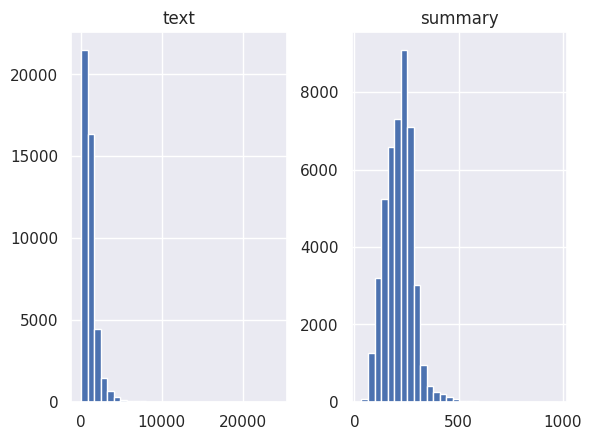

In [ ]:
import matplotlib.pyplot as plt

text_word_count=[]
summary_word_count=[]

# populate the list with sentence length

for i in train_df['cleaned_text']:
    text_word_count.append(len(i.split()))

for i in train_df['cleaned_summary']:
  summary_word_count.append(len(i.split()))

length_df = pd.DataFrame({'text':text_word_count, 'summary':summary_word_count})
length_df.hist(bins = 30)
plt.show()

# X-axis: Represents the range of word counts.
# Y-axis: Represents the frequency of texts or summaries falling within each range of word counts.

In [ ]:
sum(text_word_count)/44972

1078.7731255003114

In [ ]:
sum(summary_word_count)/44972

214.13448367873343

In [ ]:
# Cacluating the compression ratio for a rough idea

compression_ratio = (sum(text_word_count)/44972)/(sum(summary_word_count)/44972)

compression_ratio

5.037829998081008

In [ ]:
print(text_word_count.count(0))

0


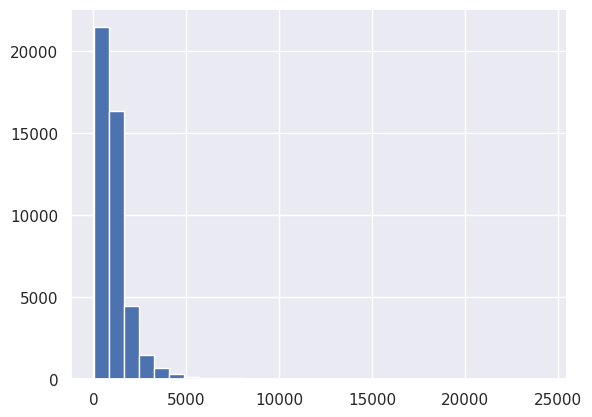

In [ ]:
# Now, we will consider the interval in which maxium of text is there ( for input text)

# Plot the histogram and capture the values
counts, bins, _ = plt.hist(text_word_count, bins=30)

# Find the index of the maximum count
max_count_index = counts.argmax()

# Retrieve the maximum count (maximum bar height)
max_count = counts[max_count_index]

# Retrieve the corresponding bin value (X-axis value)
corresponding_bin = bins[max_count_index]


In [ ]:
corresponding_bin

22.0

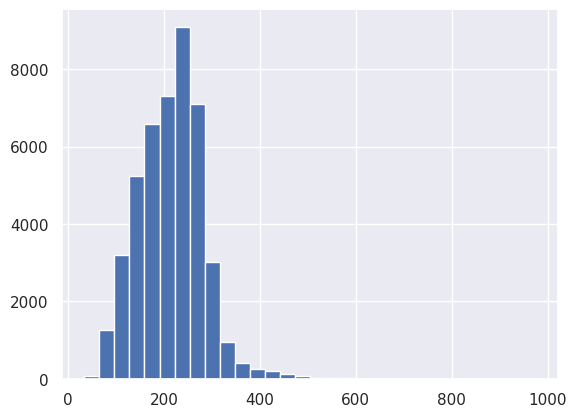

In [ ]:
# Plot the histogram and capture the values
counts, bins, _ = plt.hist(summary_word_count, bins=30)

# Find the index of the maximum count
max_count_index = counts.argmax()

# Retrieve the maximum count (maximum bar height)
max_count = counts[max_count_index]

# Retrieve the corresponding bin value (X-axis value)
corresponding_bin = bins[max_count_index]

In [ ]:
corresponding_bin

222.0

In [ ]:
def find_most_common_range_custom(word_counts):
    # Calculate histogram data from word_counts
    max_count = max(word_counts)
    bin_width = 30  # Assuming each bin represents a range of 30 words

    # Create histogram data
    histogram_data = [0] * ((max_count // bin_width) + 1)
    for count in word_counts:
        bin_index = count // bin_width
        histogram_data[bin_index] += 1

    # Find the range with the highest frequency
    max_frequency = max(histogram_data)
    index = histogram_data.index(max_frequency)
    lower_bound = index * bin_width
    upper_bound = (index + 1) * bin_width
    return lower_bound, upper_bound




# Example usage for unsummarized text
lower_bound, upper_bound = find_most_common_range_custom(text_word_count)
print(f"The most common range for unsummarized text is between {lower_bound} and {upper_bound} words.")

# Example usage for summarized text
lower_bound, upper_bound = find_most_common_range_custom(summary_word_count)
print(f"The most common range for summarized text is between {lower_bound} and {upper_bound} words.")


The most common range for unsummarized text is between 540 and 570 words.
The most common range for summarized text is between 240 and 270 words.


In [ ]:
# this will be used for padding
max_len_text=100
max_len_summary=300

## TOKENISER


In [ ]:
[row['document'] for index, row in X_train.iterrows()]

['The number of Americans seeking unemployment aid plummeted last week to seasonally adjusted 339,000, the lowest level in more than four years. The sharp drop offered a hopeful sign that the job market could pick up. \n \n In this Friday Sept. 28, 2012, photo, a group of veterans listen during a session with one of the employers at a job fair introducing veterans to careers in the security and private investigations industry... (Associated Press) \n \n The Labor Department said Thursday that weekly applications fell by 30,000 to the fewest since February 2008. The four-week average, a less volatile measure, dropped by 11,500 to 364,000, a six-month low. \n \n The positive figures follow a report last week that said the unemployment rate fell in September to 7.8 percent. It was the first time since January 2009 that the rate dropped below 8 percent. \n \n A Labor Department spokesman cautioned that the weekly applications can be volatile, particularly at the start of a quarter. And the

In [ ]:

#prepare a tokenizer for reviews on training data
X_tokenizer = Tokenizer()
X_tokenizer.fit_on_texts(X_train)
#convert text sequences into integer sequences
X_trai    =   X_tokenizer.texts_to_sequences([row['document'] for index, row in X_train.iterrows()])
#X_val   =   X_tokenizer.texts_to_sequences(X_val)
print(X_trai)
#padding zero upto maximum length
X_trai2   =   pad_sequences(X_trai,  maxlen=max_len_text, padding='post')
#X_val   =   pad_sequences(X_val, maxlen=max_len_text, padding='post')

X_voc_size   =  len(X_tokenizer.word_index) +1

[[], [], [], [], [], [], [], [], [], [], [], [1, 1, 1], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [1], [], [], [], [], [], [], [1], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [1, 1], [], [], [], [], [], [], [], [], [], [], [], [], [], [1, 1], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [1], [], [], [], [1], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [1], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [1, 1, 1], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [1, 1, 1], [], [], [], [], [], [], [], [], [], [], [], [], [1], [], [], [1], [], [], [], [], [], [1, 1], [], [], [], [], [], [], [], [], [], [],

In [ ]:
len(X_trai)

44972

In [ ]:
#preparing a tokenizer for summary on training data
y_tokenizer = Tokenizer()
y_tokenizer.fit_on_texts(list(y_train))

#convert summary sequences into integer sequences
y_train    =   y_tokenizer.texts_to_sequences(y_train)
y_val   =   y_tokenizer.texts_to_sequences(y_val)

#padding zero upto maximum length
y_train    =   pad_sequences(y_train, maxlen=max_len_summary, padding='post')
y_val   =   pad_sequences(y_val, maxlen=max_len_summary, padding='post')

y_voc_size  =   len(y_tokenizer.word_index) +1

In [ ]:
y_train.shape
max_len_summary

300

## Building our model

Some important terminologies :-  
1. return Sequences = True
LSTM will produce hidden state and cell state from every time stamp.

2. return state = True
LSTM will produce hidden state and cell state of the last timestamp only

3. Stacked LSTM
Multiple layers of LSTM stacked on top of each other , this leads to better representation of the sequence

In [ ]:
from keras.layers import Input, Embedding, LSTM, Concatenate, Dense, TimeDistributed
from keras.models import Model
from tensorflow.keras.layers import Attention
from keras import backend as K

K.clear_session()
latent_dim = 500

# Encoder
encoder_inputs = Input(shape=(max_len_text,))
enc_emb = Embedding(X_voc_size, latent_dim, trainable=True)(encoder_inputs)

#LSTM 1
encoder_lstm1 = LSTM(latent_dim, return_sequences=True, return_state=True)
encoder_output1, state_h1, state_c1 = encoder_lstm1(enc_emb)

#LSTM 2
encoder_lstm2 = LSTM(latent_dim, return_sequences=True, return_state=True)
encoder_output2, state_h2, state_c2 = encoder_lstm2(encoder_output1)

#LSTM 3
encoder_lstm3 = LSTM(latent_dim, return_state=True, return_sequences=True)
encoder_outputs, state_h, state_c = encoder_lstm3(encoder_output2)

# Set up the decoder.
decoder_inputs = Input(shape=(None,))
dec_emb_layer = Embedding(y_voc_size, latent_dim, trainable=True)
dec_emb = dec_emb_layer(decoder_inputs)

# LSTM using encoder_states as initial state
decoder_lstm = LSTM(latent_dim, return_sequences=True, return_state=True)
decoder_outputs, _, _ = decoder_lstm(dec_emb, initial_state=[state_h, state_c])

# Attention Layer
attn_out = Attention()([decoder_outputs, encoder_outputs])

# Concat attention output and decoder LSTM output
decoder_concat_input = Concatenate(axis=-1)([decoder_outputs, attn_out])

# Dense layer
decoder_dense = TimeDistributed(Dense(y_voc_size, activation='softmax'))
decoder_outputs = decoder_dense(decoder_concat_input)

# Define the model
model = Model([encoder_inputs, decoder_inputs], decoder_outputs)
model.summary()


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 100)]                0         []                            
                                                                                                  
 embedding (Embedding)       (None, 100, 500)             1000      ['input_1[0][0]']             
                                                                                                  
 lstm (LSTM)                 [(None, 100, 500),           2002000   ['embedding[0][0]']           
                              (None, 500),                                                        
                              (None, 500)]                                                        
                                                                                              

## Choosing the right loss function

1. Mean Squared Error (MSE)
* Suitable for regression tasks where the output is a continuous value.
* Calculates the average squared difference between the predicted and actual values.
2. Binary Cross-Entropy
* Used for binary classification tasks where the output is binary (0 or 1).
* Measures the difference between the probability distributions of the predicted and actual classes.
3. Categorical Cross-Entropy
* Used for multiclass classification tasks where the output is one-hot encoded.
* Measures the difference between the predicted probability distribution over classes and the true distribution.
4. Sparse Categorical Cross-Entropy
* Similar to categorical cross-entropy but used when the true labels are integers instead of one-hot encoded.
* Commonly used in cases where converting labels to one-hot encoding would be inefficient.
5. Kullback-Leibler (KL) Divergence
* Measures how one probability distribution diverges from a second, expected probability distribution.
* Often used in probabilistic models or in combination with other loss functions for regularization.
6. Hinge Loss
* Commonly used in SVMs and for margin-based classification tasks.
* Suitable for binary classification tasks when aiming for maximizing the margin between classes.
7. Huber
* Combines the best properties of MSE and MAE (Mean Absolute Error).
* Less sensitive to outliers compared to MSE.
8. Custom Loss Functions
* Tailored to our own specific needs


## Sparse categorical cross-entropy is commonly used in cases where the target labels are integers rather than one-hot encoded vectors. This is because it internally performs the conversion to one-hot encoded vectors during the computation of the loss, avoiding the need to manually convert the labels beforehand.

## Since this best suits our requirements , we will use Sparse categorical cross-entropy

In [ ]:
#defining the loss function
model.compile(optimizer='rmsprop', loss='sparse_categorical_crossentropy')

In [ ]:
# instantiating early stop
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1)

In [ ]:
import tensorflow as tf

data_list_train = [X_train, y_train[:, :-1]]
y_train_shifted = y_train[:, 1:]

data_list_val = [X_val, y_val[:, :-1]]
y_val_shifted = y_val[:, 1:]

data_tensor_train = tf.stack(data_list_train)  # Stack training data tensors
y_tensor_train = tf.stack(y_train_shifted)     # Stack training label tensors

data_tensor_val = tf.stack(data_list_val)      # Stack validation data tensors
y_tensor_val = tf.stack(y_val_shifted)         # Stack validation label tensors

history = model.fit(
    x=data_tensor_train,    # Training data tensor
    y=y_tensor_train,       # Training label tensor
    verbose=0,              # Set verbosity level (0 for silent)
    epochs=100,             # Number of epochs for training
    validation_data=(
        data_tensor_val,    # Validation data tensor
        y_tensor_val       # Validation label tensor
    )
)


InvalidArgumentError: {{function_node __wrapped__Pack_N_2_device_/job:localhost/replica:0/task:0/device:CPU:0}} Shapes of all inputs must match: values[0].shape = [1,100] != values[1].shape = [44972,299] [Op:Pack] name: stack

In [ ]:
print("X_train shape:", X_train.shape)
print("y_train shape:", y_train.shape)
print("X_val shape:", X_val.shape)
print("y_val shape:", y_val.shape)
